# what's the dcgan 
dcgan is ddirect extension of the GAN it's uses convolutional and convolutionaltranpose layers in discriminator and generator respectively . 

* Generator creates the images and discriminator detects if they are original or not in turn making the generator better with each epoch and it'll generate more good and most similar images to training data 

# importing required libraries 

In [ ]:
import os 
import random 
import torch 
import torch.nn as nn 
import torch.nn.parallel 
import torch.backends.cudnn as cudnn
import torch.optim as optim 
import torch.utils.data
import torchvision.datasets as dset 
import torchvision.transforms as transforms 
import torchvision.utils as vutils 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.animation as animation 
from IPython.display import HTML 

In [ ]:
# settign the parameteers 
dataroot = '/content/celeba'
workers = 2 
batch_size = 128
image_size = 64
nc = 3 
nz = 100 
ngf = 64
ndf = 64
num_epochs = 5 
lr = 0.0002
beta1 = 0.5 
ngpu = 1 

# downloading the dataset 

In [ ]:
!gdown https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM

Downloading...
From: https://drive.google.com/uc?id=0B7EVK8r0v71pZjFTYXZWM3FlRnM
To: /content/img_align_celeba.zip
1.44GB [00:20, 71.4MB/s]


In [ ]:
!unzip img_align_celeba.zip

Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/197600.jpg  
 extracting: img_align_celeba/197601.jpg  
 extracting: img_align_celeba/197602.jpg  
 extracting: img_align_celeba/197603.jpg  
 extracting: img_align_celeba/197604.jpg  
 extracting: img_align_celeba/197605.jpg  
 extracting: img_align_celeba/197606.jpg  
 extracting: img_align_celeba/197607.jpg  
 extracting: img_align_celeba/197608.jpg  
 extracting: img_align_celeba/197609.jpg  
 extracting: img_align_celeba/197610.jpg  
 extracting: img_align_celeba/197611.jpg  
 extracting: img_align_celeba/197612.jpg  
 extracting: img_align_celeba/197613.jpg  
 extracting: img_align_celeba/197614.jpg  
 extracting: img_align_celeba/197615.jpg  
 extracting: img_align_celeba/197616.jpg  
 extracting: img_align_celeba/197617.jpg  
 extracting: img_align_celeba/197618.jpg  
 extracting: img_align_celeba/197619.jpg  
 extracting: img_align_celeba/197620.jpg  
 extracting: img_align_celeba/197621.jpg  
 ex

In [ ]:
!nvidia-smi

Fri Sep 10 08:00:55 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

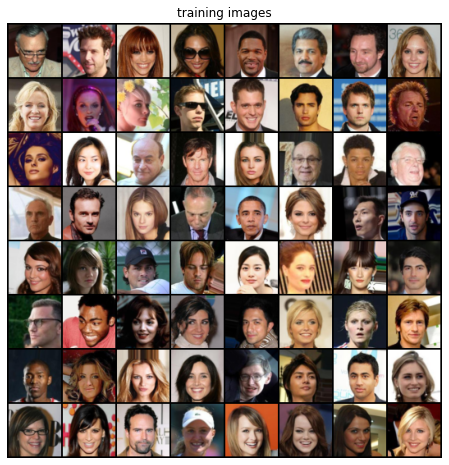

In [ ]:
# getting the dataset ready and passing it to dataloader 
dataset = dset.ImageFolder(root = dataroot, 
                           transform = transforms.Compose([
                                   transforms.Resize(image_size), 
                                   transforms.CenterCrop(image_size), 
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))                         
                           ]))

dataloader = torch.utils.data.DataLoader(dataset , batch_size = batch_size , 
                                         shuffle = True , num_workers = workers)

device = torch.device('cuda' if (torch.cuda.is_available() and ngpu >0 ) else 'cpu')

real_batch = next(iter(dataloader))
plt.figure(figsize = (8,8))

plt.axis('off')
plt.title('training images')
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding = 2, normalize = True ).cpu(), (1,2,0)))

In [ ]:
# making custom weights initialization 
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0,0.2)
  elif classname.find('BatchNorm') != -1 :
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

# creating generator 

class generator will create images 

In [ ]:
class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator ,self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.ConvTranspose2d(nz, ngf* 8 , 4, 1 , 0 , bias = False),
        nn.BatchNorm2d(ngf*8), 
        nn.ReLU(True), 
        # new 
      nn.ConvTranspose2d(ngf*8 , ngf* 4 , 4, 2 , 1 , bias = False),
        nn.BatchNorm2d(ngf*4), 
        nn.ReLU(True), 
        # new 
      nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1 , bias = False),
        nn.BatchNorm2d(ngf*2), 
        nn.ReLU(True), 
        #new 
      nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias = False),
        nn.BatchNorm2d(ngf), 
        nn.ReLU(True), 
        #new 
     nn.ConvTranspose2d(ngf, nc, 4, 2, 1,  bias=False),
            nn.Tanh()

    )

  def forward(self,input):
    return self.main(input)
  

In [ ]:
# instantiate the generator 

netG = Generator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
  netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
# discriminator code 

class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator , self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.Conv2d(nc, ndf, 4, 2, 1 , bias = False), 
        nn.LeakyReLU(0.2, inplace = True), 
        nn.Conv2d(ndf , ndf * 2, 4, 2, 1, bias = False), 
        nn.BatchNorm2d(ndf*2), 
        nn.LeakyReLU(0.2, inplace=True),
       # state size. (ndf*2) x 16 x 16
        nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 4),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*4) x 8 x 8
        nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 8),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*8) x 4 x 4
        nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid()
    )

  def forward(self, input):
    return self.main(input)

In [ ]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
loss_fn = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device = device)

real_label = 1. 
fake_label = 0 

# setting up optimizer  
optimizerD = optim.Adam(netD.parameters(), lr = lr , betas =(beta1 , 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = lr , betas = (beta1, 0.999))




# trianing GAN network 



## part 1 ; trianing the discriminator 

## part 2 : trianing the generator 


In [ ]:
img_list = [] 
G_losses = []
D_losses = []
iters = 0 

print('starting training loop')

for epoch in range(num_epochs):
  for i,data in enumerate(dataloader, 0 ) :
    netD.zero_grad()
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, dtype = torch.float, device = device)
    output = netD(real_cpu).view(-1)

    errD_real = loss_fn(output , label)

    errD_real.backward()
    D_x = output.mean().item()


    ## training with the fake batch 

    noise = torch.randn(b_size , nz , 1, 1, device = device)
    fake = netG(noise)
    label.fill_(fake_label)
    output = netD(fake.detach()).view(-1)
    errD_fake = loss_fn(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    errD = errD_real + errD_fake

    optimizerD.step()
    netG.zero_grad()
    label.fill_(real_label)
    output = netD(fake).view(-1)
    errG = loss_fn(output, label)
    errG.backward()
    D_G_z2 = output.mean().item()

    optimizerG.step()

    if i % 50 == 0 :
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
    G_losses.append(errG.item())
    D_losses.append(errD.item())

    if(iters % 500 == 0) or ((epoch == num_epochs -1 ) and (i == len(dataloader)-1)):
      with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake,padding = 2, normalize = True))
    iters +=1 

starting training loop
[0/5][0/1583]	Loss_D: 15.4128	Loss_G: 14.6816	D(x): 0.1218	D(G(z)): 0.0702 / 0.0972
[0/5][50/1583]	Loss_D: 0.9623	Loss_G: 15.4822	D(x): 0.9536	D(G(z)): 0.1246 / 0.0466
[0/5][100/1583]	Loss_D: 0.3955	Loss_G: 19.9779	D(x): 0.9629	D(G(z)): 0.0234 / 0.0005
[0/5][150/1583]	Loss_D: 0.1328	Loss_G: 23.0456	D(x): 0.9896	D(G(z)): 0.0345 / 0.0002
[0/5][200/1583]	Loss_D: 0.6460	Loss_G: 26.5297	D(x): 0.9844	D(G(z)): 0.0609 / 0.0001
[0/5][250/1583]	Loss_D: 0.1820	Loss_G: 23.4300	D(x): 0.9914	D(G(z)): 0.0004 / 0.0000
[0/5][300/1583]	Loss_D: 0.0303	Loss_G: 22.4106	D(x): 0.9930	D(G(z)): 0.0090 / 0.0001
[0/5][350/1583]	Loss_D: 0.0139	Loss_G: 50.1351	D(x): 0.9935	D(G(z)): 0.0000 / 0.0000
[0/5][400/1583]	Loss_D: 0.0000	Loss_G: 44.9597	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/5][450/1583]	Loss_D: 0.0000	Loss_G: 49.8049	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[0/5][500/1583]	Loss_D: 0.0002	Loss_G: 30.3562	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[0/5][550/1583]	Loss_D: 0.0000	Loss_G: 81.86

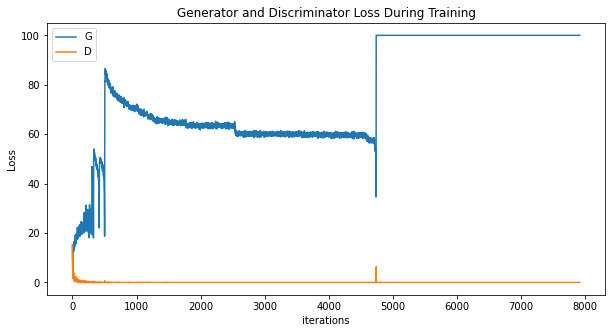

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

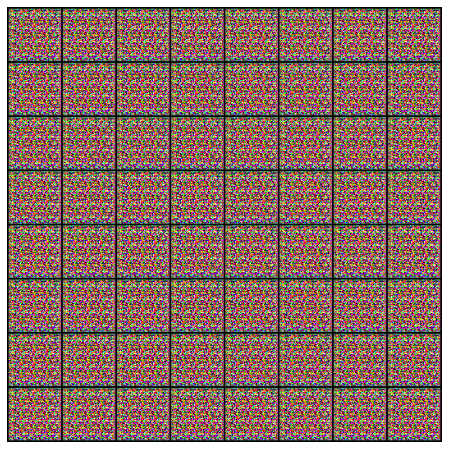

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())